**Computer Vision - Assignment1**

**Farimah Rashidi - 99222040**

In [118]:
from google.colab import drive
drive.mount('content')

Mounted at content


In [119]:
import matplotlib.image as mpimg
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.exposure import match_histograms
from skimage import exposure
from skimage import exposure
import re

# Q1

**A)**

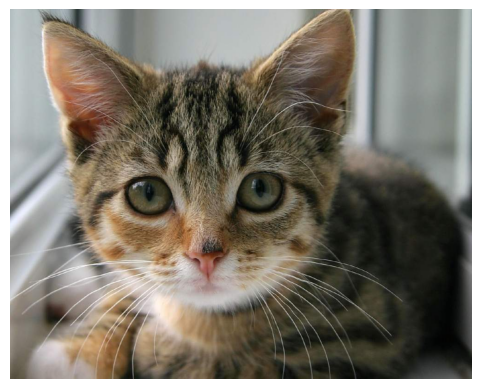

In [ ]:
image1 = mpimg.imread("/content/content/MyDrive/assignment1 - computer vision - images/Image1.jpeg")
plt.imshow(image1)
plt.axis('off')
plt.show()

**B)**

In [ ]:
image1 = cv2.imread("/content/content/MyDrive/assignment1 - computer vision - images/Image1.jpeg")

image1_rgb = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
r, g, b = cv2.split(image1_rgb)

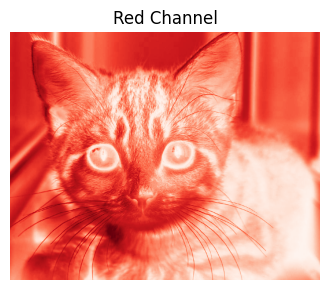

In [ ]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(r, cmap='Reds')
ax.set_title('Red Channel')
ax.axis('off')
plt.show()

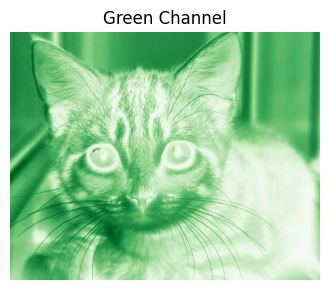

In [ ]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(g, cmap='Greens')
ax.set_title('Green Channel')
ax.axis('off')
plt.show()

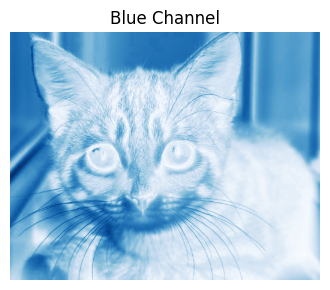

In [ ]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.imshow(b, cmap='Blues')
ax.set_title('Blue Channel')
ax.axis('off')
plt.show()

**C)**

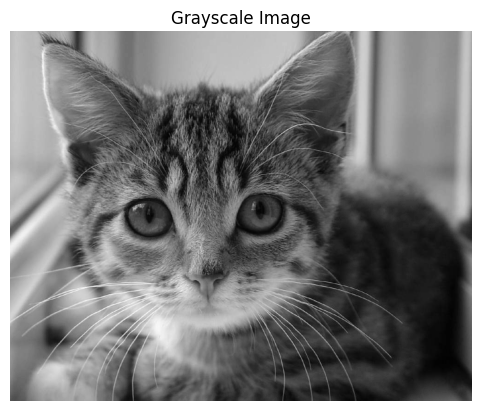

In [ ]:
def rgb_to_grayscale(image1_rgb):
    #Weights for the RGB channels from the Y'UV color space
    weights = [0.2989, 0.5870, 0.1140]

    #Convert to grayscale using the weights for RGB channels
    grayscale_image = np.dot(image1_rgb[...,:3], weights)
    return grayscale_image

#Convert to grayscale
grayscale_image = rgb_to_grayscale(image1_rgb)

plt.imshow(grayscale_image, cmap='gray')
plt.axis('off')
plt.title('Grayscale Image')
plt.show()

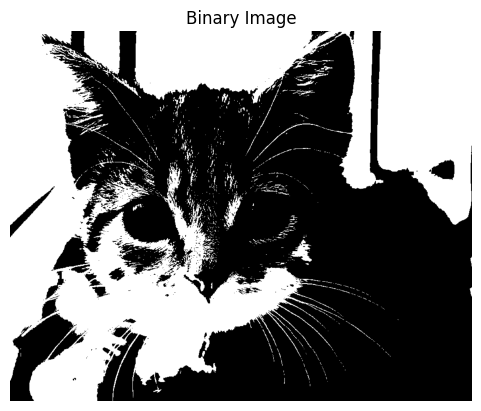

In [ ]:
def grayscale_to_binary(grayscale_image, threshold=128):
    #binary image based on the threshold
    binary_image = grayscale_image > threshold
    #Convert boolean values to int
    binary_image = binary_image.astype(int) * 255
    return binary_image

#Convert to binary
binary_image = grayscale_to_binary(grayscale_image)

plt.imshow(binary_image, cmap='gray')
plt.axis('off')
plt.title('Binary Image')
plt.show()

**D)**

In [ ]:
def rgb_to_hsv(image1_rgb):

    r = image1_rgb[:, :, 0] / 255.0
    g = image1_rgb[:, :, 1] / 255.0
    b = image1_rgb[:, :, 2] / 255.0

    max_val = np.max(image1_rgb, axis=2) / 255.0
    min_val = np.min(image1_rgb, axis=2) / 255.0
    d = max_val - min_val

    v = max_val  #Brightness

    s = np.where(v == 0, 0, d / v)  #Saturation

    #Hue calculation
    h = np.zeros_like(v)

    non_zero_delta = d > 0
    # Red is max
    idx = (max_val == r) & non_zero_delta
    h[idx] = ((g[idx] - b[idx]) / d[idx]) % 6
    # Green is max
    idx = (max_val == g) & non_zero_delta
    h[idx] = ((b[idx] - r[idx]) / d[idx]) + 2
    # Blue is max
    idx = (max_val == b) & non_zero_delta
    h[idx] = ((r[idx] - g[idx]) / d[idx]) + 4
    h /= 6

    # Convert h to the range [0, 360]
    h *= 360
    # Convert s and v to the range [0, 255]
    s *= 255
    v *= 255

    hsv_img = np.zeros_like(image1_rgb)
    hsv_img[:, :, 0] = h
    hsv_img[:, :, 1] = s
    hsv_img[:, :, 2] = v

    return hsv_img.astype(np.uint8)

<ipython-input-11-308d9accf34b>:13: RuntimeWarning: invalid value encountered in divide
  s = np.where(v == 0, 0, d / v)  #Saturation


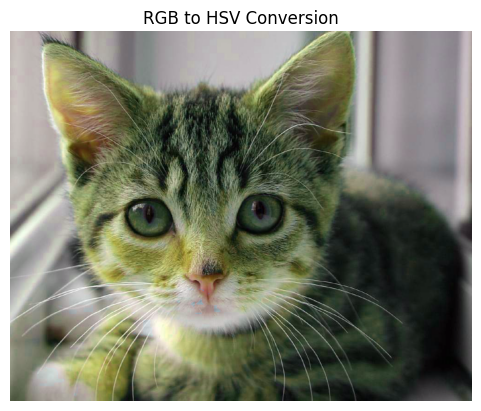

In [ ]:
hsv_image = rgb_to_hsv(image1_rgb)

plt.imshow(cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB))
plt.title('RGB to HSV Conversion')
plt.axis('off')
plt.show()

**E)**

In [ ]:
image1_using_library = cv2.cvtColor(image1, cv2.COLOR_BGR2HSV)

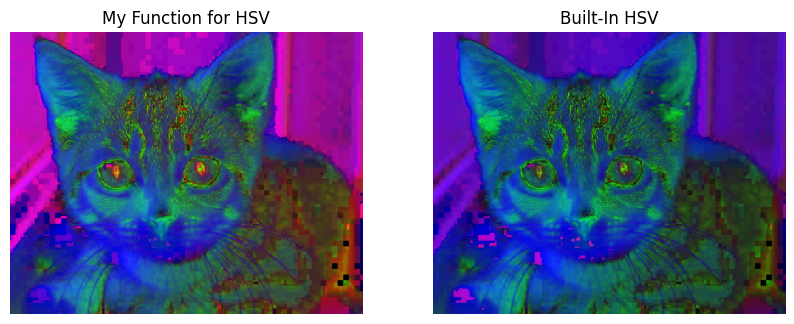

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

axes[0].imshow(hsv_image, cmap='hsv')
axes[0].set_title('My Function for HSV')
axes[0].axis('off')

axes[1].imshow(image1_using_library, cmap='hsv')
axes[1].set_title('Built-In HSV')
axes[1].axis('off')

plt.show()

**F)**

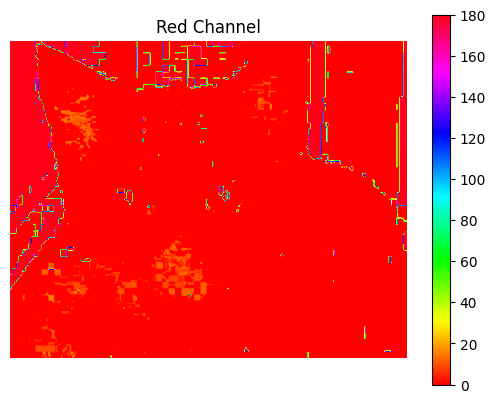

In [ ]:
hue_channel = hsv_image[:, :, 0]

lower_bound = 330 / 2
upper_bound = 30 / 2


lower_bound %= 180
upper_bound %= 180


red_channel_mask = np.where((hue_channel >= lower_bound) | (hue_channel <= upper_bound), 1, 0)

red_channel = hue_channel * red_channel_mask

plt.imshow(red_channel, cmap='hsv', vmin=0, vmax=180)
plt.title('Red Channel')
plt.axis('off')
plt.colorbar()
plt.show()

# Q2

In [ ]:
image_21 = cv2.cvtColor(cv2.imread('/content/content/MyDrive/assignment1 - computer vision - images/Image2.1.jpg'), cv2.COLOR_BGR2RGB)
image_22= cv2.cvtColor(cv2.imread('/content/content/MyDrive/assignment1 - computer vision - images/Image2.2.jpg'), cv2.COLOR_BGR2RGB)

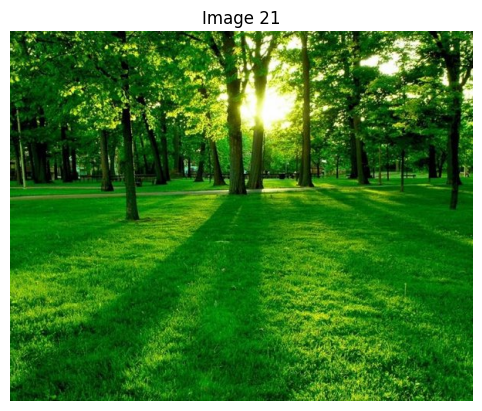

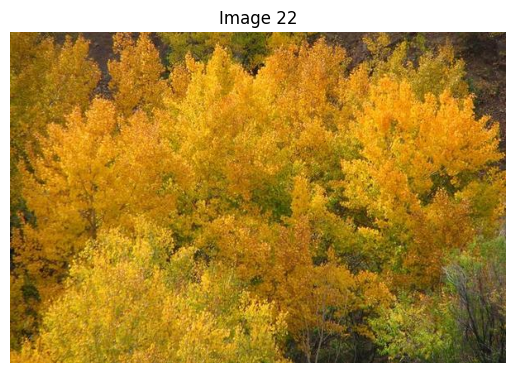

In [ ]:
plt.title('Image 21')
plt.imshow(image_21)
plt.axis('off')
plt.show()

plt.title('Image 22')
plt.imshow(image_22)
plt.axis('off')
plt.show()

In [ ]:
r, g, b = cv2.split(image_21)
hist_r_21 = cv2.calcHist([r], [0], None, [256], [0, 256])
hist_g_21 = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_b_21 = cv2.calcHist([b], [0], None, [256], [0, 256])

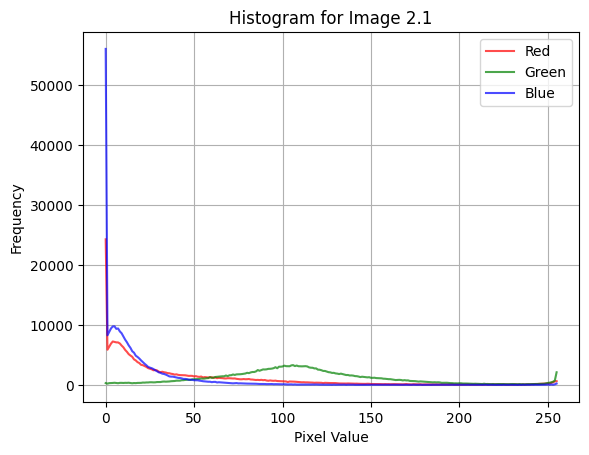

In [ ]:
plt.plot(hist_r_21, color='red', label='Red', alpha=0.7)
plt.plot(hist_g_21, color='green', label='Green', alpha=0.7)
plt.plot(hist_b_21, color='blue', label='Blue', alpha=0.7)

plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Histogram for Image 2.1')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
r, g, b = cv2.split(image_22)
hist_r_22 = cv2.calcHist([r], [0], None, [256], [0, 256])
hist_g_22 = cv2.calcHist([g], [0], None, [256], [0, 256])
hist_b_22 = cv2.calcHist([b], [0], None, [256], [0, 256])

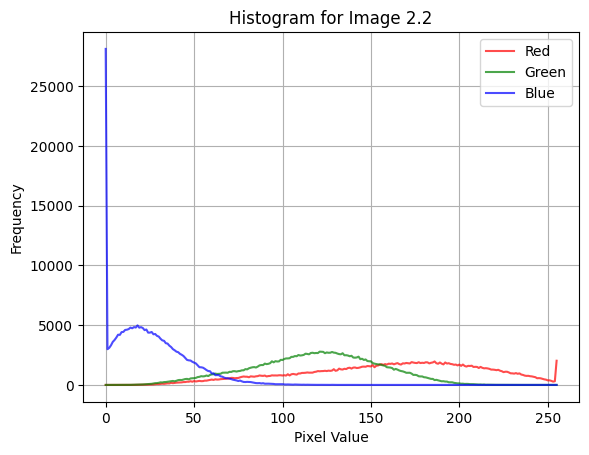

In [ ]:
plt.plot(hist_r_22, color='red', label='Red', alpha=0.7)
plt.plot(hist_g_22, color='green', label='Green', alpha=0.7)
plt.plot(hist_b_22, color='blue', label='Blue', alpha=0.7)

plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Histogram for Image 2.2')
plt.legend()
plt.grid(True)
plt.show()

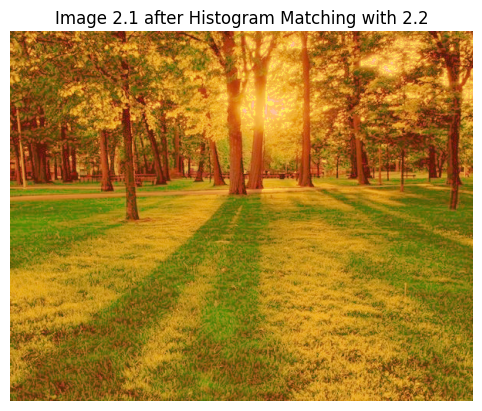

In [ ]:
#Match histograms
matched_image = exposure.match_histograms(image_21, image_22, channel_axis=-1)

plt.imshow(matched_image)
plt.title('Image 2.1 after Histogram Matching with 2.2')
plt.axis('off')
plt.show()

# Q3

**A)**

In [ ]:
image3 = cv2.cvtColor(cv2.imread('/content/content/MyDrive/assignment1 - computer vision - images/Image3.jpg'), cv2.COLOR_BGR2RGB)


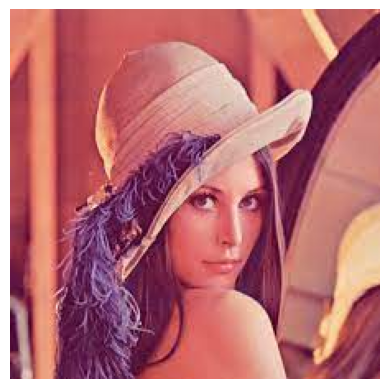

In [ ]:
plt.imshow(image3)
plt.axis('off')
plt.show()

In [ ]:
r, g, b = cv2.split(image3)

r_filtered = cv2.medianBlur(cv2.medianBlur(r, 3), 3)
g_filtered = cv2.medianBlur(cv2.medianBlur(g, 3), 3)
b_filtered = cv2.medianBlur(cv2.medianBlur(b, 3), 3)

median_filtering_3by3 = cv2.merge((r_filtered, g_filtered, b_filtered))

In [ ]:
r, g, b = cv2.split(image3)

r_filtered = cv2.medianBlur(r, 9)
g_filtered = cv2.medianBlur(g, 9)
b_filtered = cv2.medianBlur(b, 9)

median_filtering_9by9 = cv2.merge((r_filtered, g_filtered, b_filtered))

In [ ]:
r, g, b = cv2.split(image3)

r_filtered = cv2.GaussianBlur(r, (5, 5), 0)
g_filtered = cv2.GaussianBlur(g, (5, 5), 0)
b_filtered = cv2.GaussianBlur(b, (5, 5), 0)

gaussian_filtering_5by5 = cv2.merge((r_filtered, g_filtered, b_filtered))

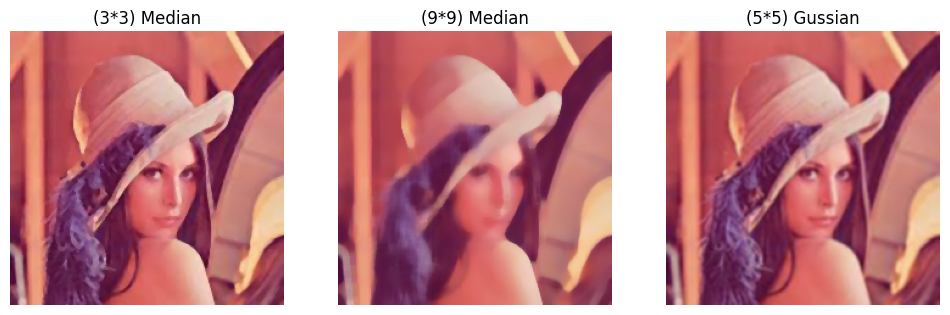

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(12, 9))

axes[0].imshow(median_filtering_3by3)
axes[0].set_title('(3*3) Median')
axes[0].axis('off')

axes[1].imshow(median_filtering_9by9)
axes[1].set_title('(9*9) Median')
axes[1].axis('off')

axes[2].imshow(gaussian_filtering_5by5)
axes[2].set_title('(5*5) Gussian')
axes[2].axis('off')

plt.show()

we can see that 3 * 3 and 5 * 5 are as same as each other.

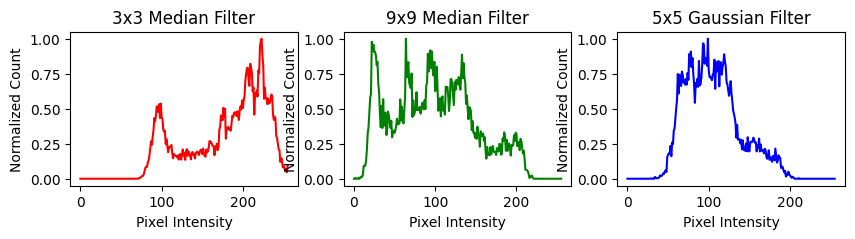

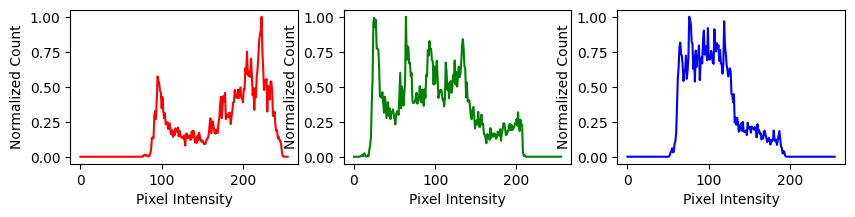

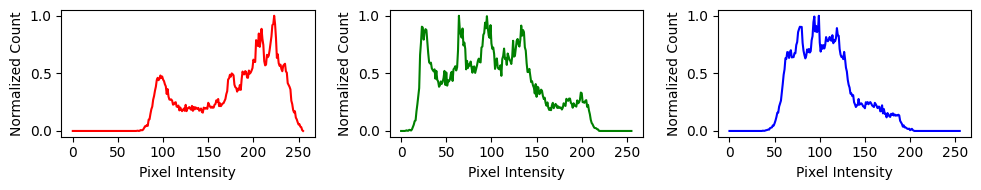

In [ ]:
fig1 , axes1 = plt.subplots(1, 3, figsize=(10, 2))
fig2 , axes2 = plt.subplots(1, 3, figsize=(10, 2))
fig3 , axes3 = plt.subplots(1, 3, figsize=(10, 2))


img1, img2, img3 = median_filtering_3by3, median_filtering_9by9, gaussian_filtering_5by5
for c, c_color in zip(range(3), ('red', 'green', 'blue')):
    img_hist, bins = exposure.histogram(img1[..., c], source_range='dtype')
    axes1[c].plot(bins, img_hist / img_hist.max(), color=c_color)
    axes1[c].set_ylabel(c_color)

for c, c_color in zip(range(3), ('red', 'green', 'blue')):
    img_hist, bins = exposure.histogram(img2[..., c], source_range='dtype')
    axes2[c].plot(bins, img_hist / img_hist.max(), color=c_color)
    axes2[c].set_ylabel(c_color)

for c, c_color in zip(range(3), ('red', 'green', 'blue')):
    img_hist, bins = exposure.histogram(img3[..., c], source_range='dtype')
    axes3[c].plot(bins, img_hist / img_hist.max(), color=c_color)
    axes3[c].set_ylabel(c_color)

# Set titles
axes1[0].set_title('3x3 Median Filter')
axes1[1].set_title('9x9 Median Filter')
axes1[2].set_title('5x5 Gaussian Filter')

# Set the x and y labels for each row of axes
for ax in axes1:
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Normalized Count')

for ax in axes2:
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Normalized Count')

for ax in axes3:
    ax.set_xlabel('Pixel Intensity')
    ax.set_ylabel('Normalized Count')

# Adjust layout for better fit
plt.tight_layout()
plt.show()

**B)**

In [ ]:
r, g, b = cv2.split(image3)

r_filtered = cv2.medianBlur(r, 5)
g_filtered = cv2.medianBlur(g, 5)
b_filtered = cv2.medianBlur(b, 5)

filtering_5_by_median = cv2.merge((r_filtered, g_filtered, b_filtered))

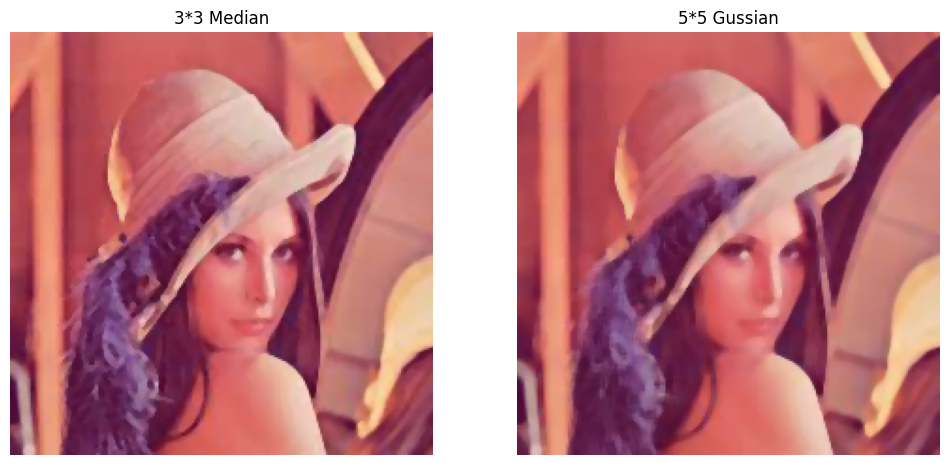

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(median_filtering_3by3)
axes[0].set_title('3*3 Median')
axes[0].axis('off')

axes[1].imshow(filtering_5_by_median)
axes[1].set_title('5*5 Gussian')
axes[1].axis('off')

plt.show()

**C)**

PSNR measurement show that to what extent two images are close in terms of pixel-wise similarity.

In [ ]:
cv2.PSNR(median_filtering_3by3, median_filtering_9by9)

27.29738986477564

In [ ]:
cv2.PSNR(median_filtering_3by3, gaussian_filtering_5by5)

33.88888897427414

PSNR is more for I and III. The quality difference between the two pictures are so low that human eye cannot tell the difference.

Two (3 * 3) Median Filters' are equivalent to 'One (5 * 5) Gussian Filter

# Q4

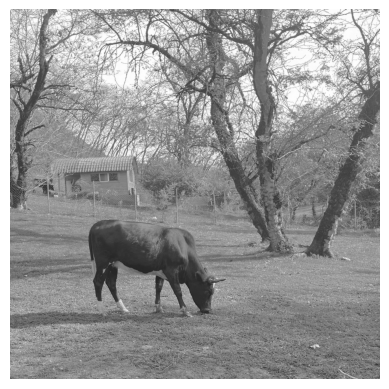

In [ ]:
image4 = cv2.cvtColor(cv2.imread('/content/content/MyDrive/assignment1 - computer vision - images/Image4.jpeg'), cv2.COLOR_BGR2RGB)

plt.imshow(image4)
plt.axis('off')
plt.show()

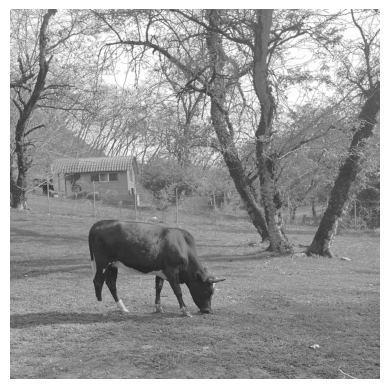

In [ ]:
image4 = cv2.cvtColor(image4, cv2.COLOR_BGR2GRAY)

plt.imshow(image4, cmap='gray')
plt.axis('off')
plt.show()

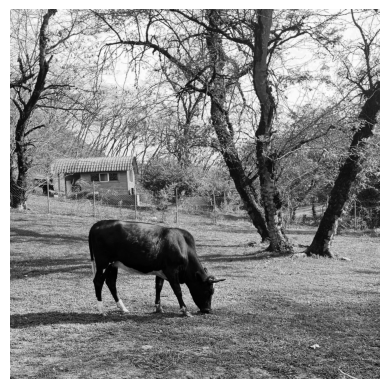

In [ ]:
#Now we use library to equalize histogram
image4_using_library = cv2.equalizeHist(image4)

plt.imshow(image4_using_library, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
hist_image4, bins = np.histogram(image4.flatten(), 256, [0, 256])
hist_image4_using_library = np.histogram(image4_using_library.flatten(), 256, [0, 256])

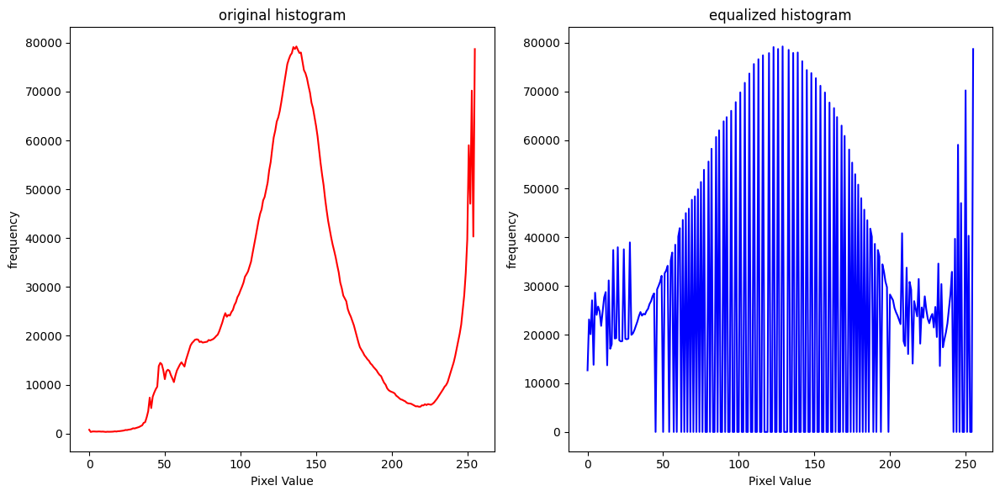

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.plot(hist_image4, color='r')
ax1.set_title('original histogram')
ax1.set_xlabel('Pixel Value')
ax1.set_ylabel('frequency')

ax2.plot(hist_image4_using_library[0], color='b')
ax2.set_title('equalized histogram')
ax2.set_xlabel('Pixel Value')
ax2.set_ylabel('frequency')

plt.tight_layout()

plt.show()

In [ ]:
hist_image4 = np.zeros(256)

for pixel_value in image4.flatten():
    hist_image4[pixel_value] += 1

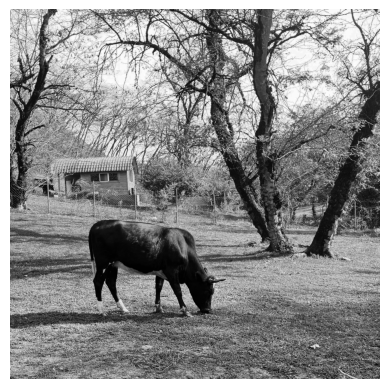

In [ ]:
cdf = np.cumsum(hist_image4)
cdf_normalized = (cdf - cdf.min()) * 255 / (cdf.max() - cdf.min())
cdf_normalized = cdf_normalized.astype(np.uint8)
equalized_image = cdf_normalized[image4]

plt.imshow(equalized_image, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
cv2.PSNR(equalized_image, image4_using_library)

51.32444370379762

As we know, if the PSNR value is more than 30, the result is good.

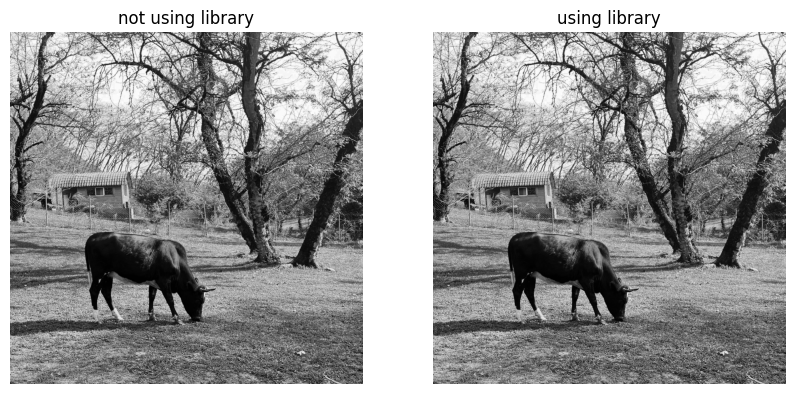

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 8))

axes[0].imshow(equalized_image, cmap='gray')
axes[0].set_title('not using library')
axes[0].axis('off')

axes[1].imshow(image4_using_library, cmap='gray')
axes[1].set_title('using library')
axes[1].axis('off')

plt.show()

# Q5

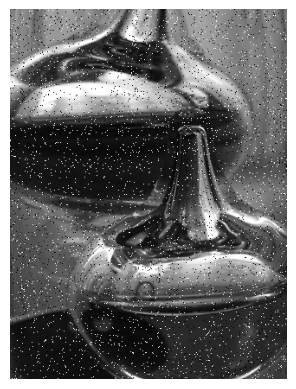

In [ ]:
image5 = cv2.imread('/content/content/MyDrive/assignment1 - computer vision - images/Image5.png')

plt.imshow(image5, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
#bilateral filtering
image5_bilateral = cv2.bilateralFilter(image5, 9, 75, 75)

#non-local means denoising
image5_denoised = cv2.fastNlMeansDenoising(image5, None, h=10, templateWindowSize=7, searchWindowSize=21)

#Guassian Filter
image5_gaussian = cv2.GaussianBlur(image5, (5, 5), 0)

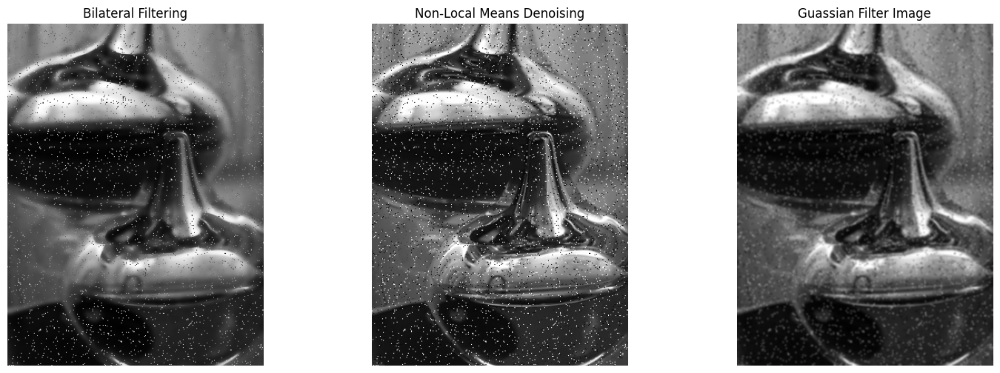

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

#Bilateral Filtering
axes[0].imshow(image5_bilateral, cmap='gray')
axes[0].set_title('Bilateral Filtering')
axes[0].axis('off')

#Non-Local Means Denoising
axes[1].imshow(image5_denoised, cmap='gray')
axes[1].set_title('Non-Local Means Denoising')
axes[1].axis('off')

#Guassian Filter
axes[2].imshow(image5_gaussian, cmap='gray')
axes[2].set_title('Guassian Filter Image')
axes[2].axis('off')

plt.show()

In [ ]:
image5_med3 = cv2.medianBlur(image5, 3)
image5_med5 = cv2.medianBlur(image5, 5)
image5_med7 = cv2.medianBlur(image5, 7)

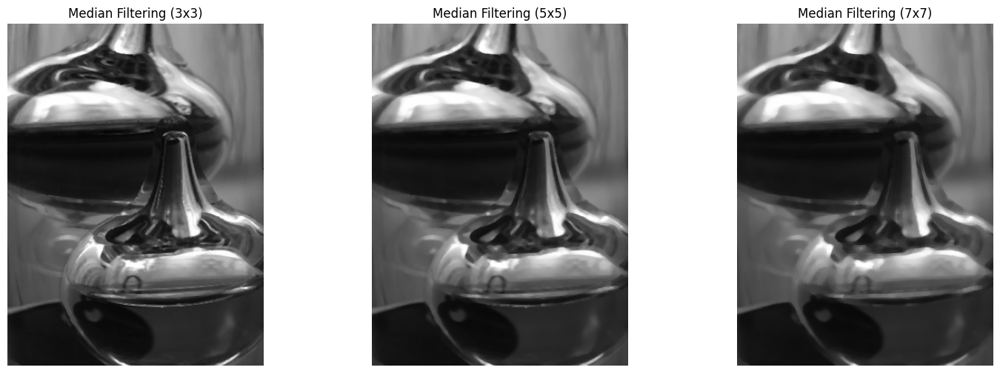

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image5_med3, cmap='gray')
axes[0].set_title('Median Filtering (3x3)')
axes[0].axis('off')

axes[1].imshow(image5_med5, cmap='gray')
axes[1].set_title('Median Filtering (5x5)')
axes[1].axis('off')

axes[2].imshow(image5_med7, cmap='gray')
axes[2].set_title('Median Filtering (7x7)')
axes[2].axis('off')

plt.show()

In [ ]:
image5 = cv2.cvtColor(image5, cv2.COLOR_BGR2GRAY)
image5_equalized_histogram = cv2.equalizeHist(image5)
image5_equalized_histogram = image5_equalized_histogram

image5_equalized_histogram_med3 = cv2.medianBlur(image5_equalized_histogram, 3)
image5_equalized_histogram_med5 = cv2.medianBlur(image5_equalized_histogram, 5)
image5_equalized_histogram_med7 = cv2.medianBlur(image5_equalized_histogram, 7)

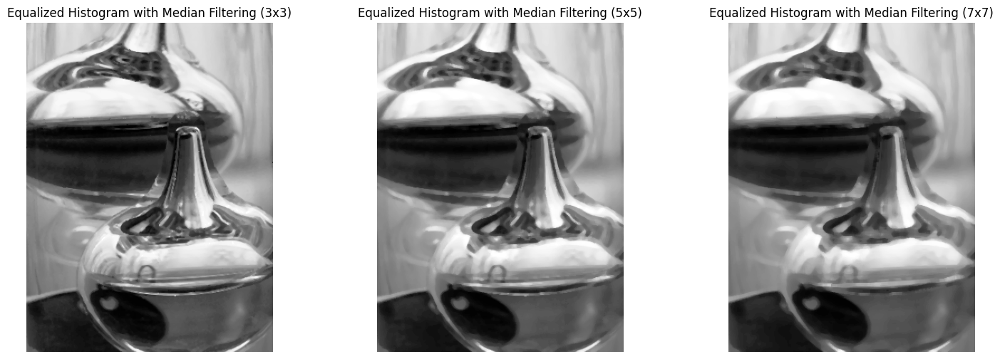

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image5_equalized_histogram_med3, cmap='gray')
axes[0].set_title('Equalized Histogram with Median Filtering (3x3)')
axes[0].axis('off')

axes[1].imshow(image5_equalized_histogram_med5, cmap='gray')
axes[1].set_title('Equalized Histogram with Median Filtering (5x5)')
axes[1].axis('off')

axes[2].imshow(image5_equalized_histogram_med7, cmap='gray')
axes[2].set_title('Equalized Histogram with Median Filtering (7x7)')
axes[2].axis('off')

plt.show()

# Q6

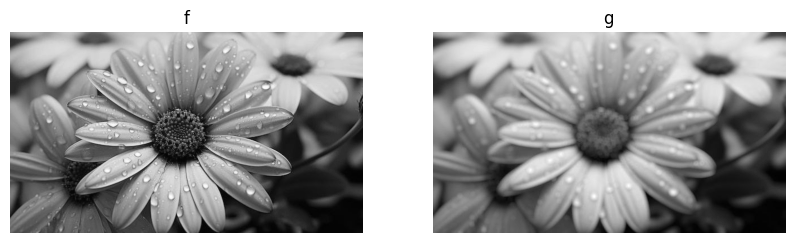

In [120]:
image_f = cv2.cvtColor(cv2.imread('/content/content/MyDrive/assignment1 - computer vision - images/flower.jpg'), cv2.COLOR_BGR2GRAY)
image_g = cv2.cvtColor(cv2.imread('/content/content/MyDrive/assignment1 - computer vision - images/blur-flowerr.jpg'), cv2.COLOR_BGR2GRAY)


fig, axes = plt.subplots(1, 2, figsize=(10, 8))

axes[0].imshow(image_f, cmap='gray')
axes[0].set_title('f')
axes[0].axis('off')

axes[1].imshow(image_g, cmap='gray')
axes[1].set_title('g')
axes[1].axis('off')

plt.show()

In [121]:
def unsharp_masking(number):
    '''
    difference = image_f.astype(np.float32) - image_g.astype(np.float32)

    normalize_diff = np.clip((difference - np.min(difference)) / (np.max(difference) - np.min(difference)), 0, 1)

    enhanced_version = image_f.astype(np.float32) + number * normalize_diff

    enhanced_version = np.clip(enhanced_version, 0, 255).astype(np.uint8)
    '''
    enhanced_version = image_f + number * (image_f - image_g)

    return enhanced_version

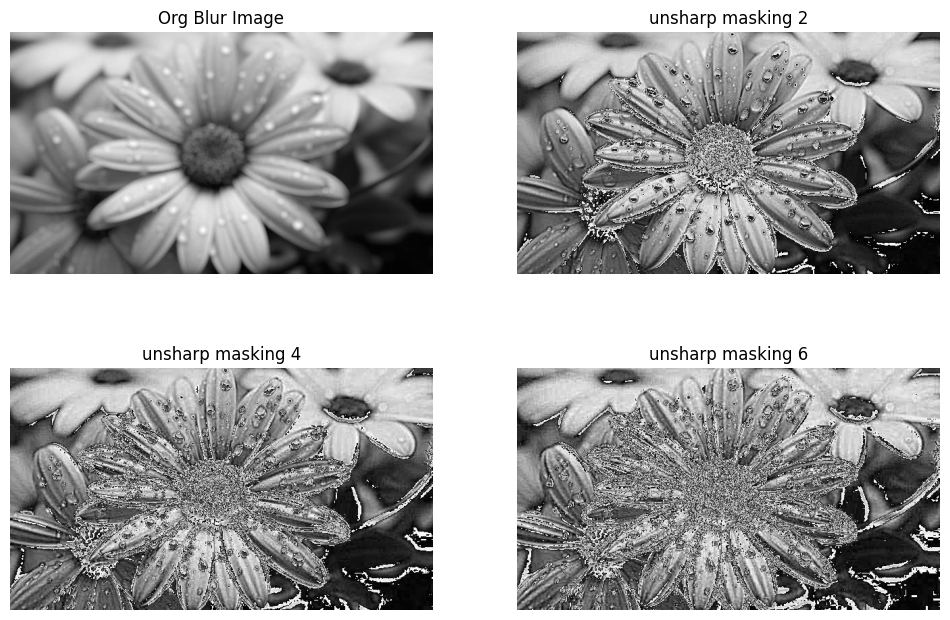

In [123]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0, 0].imshow(image_g, cmap='gray')
axes[0, 0].set_title('Org Blur Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(unsharp_masking(2), cmap='gray')
axes[0, 1].set_title('unsharp masking 2')
axes[0, 1].axis('off')

axes[1, 0].imshow(unsharp_masking(4), cmap='gray')
axes[1, 0].set_title('unsharp masking 4')
axes[1, 0].axis('off')

axes[1, 1].imshow(unsharp_masking(6), cmap='gray')
axes[1, 1].set_title('unsharp masking 6')
axes[1, 1].axis('off')

plt.show()

# Q7

In [109]:
text = '/content/content/MyDrive/assignment1 - computer vision - images/input1.txt'


In [110]:
def text_to_image(text):
    with open(text, 'r') as file:
        lines = file.readlines()
        h, w, _ = map(int, lines[0].split())

        rgbs = []
        for line in lines[1:]:
            numbers = list(map(int, re.findall(r'\d+', line)))
            for i in range(0, len(numbers), 3):
                rgbs.append(tuple(numbers[i:i+3]))

        image = np.array(rgbs, dtype=np.uint8).reshape((h, w, 3))

        grayscale_image = np.mean(image, axis=2).astype(np.uint8)
        return grayscale_image

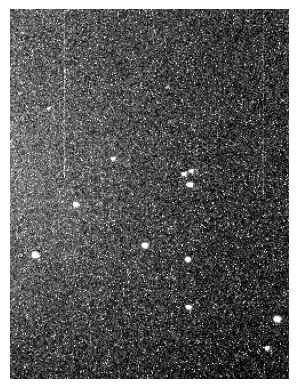

In [111]:
image = text_to_image(text)

plt.imshow(image, cmap='gray')
plt.axis('off')
plt.show()

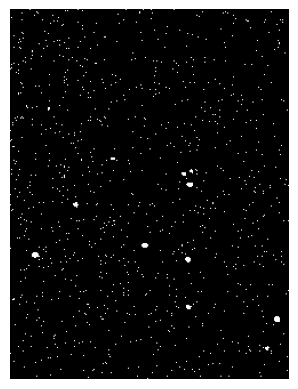

In [112]:
image_binary = np.where(image < 253, 0, 255).astype(np.uint8)

plt.imshow(image_binary, cmap='gray')
plt.axis('off')
plt.show()

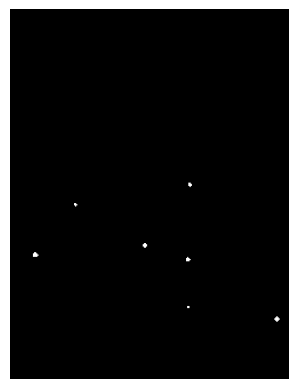

In [113]:
filtered_image = cv2.medianBlur(image_binary, 5)

plt.imshow(filtered_image, cmap='gray')
plt.axis('off')
plt.show()

In [114]:
def white_dot_centroids_detection(image_binary, min_area=6, visualize=False):
    contours, _ = cv2.findContours(image_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    centroids = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > min_area:
            M = cv2.moments(contour)
            if M['m00'] != 0:
                centroid_x = int(M['m10'] / M['m00'])
                centroid_y = int(M['m01'] / M['m00'])
                centroids.append((centroid_x, centroid_y))

    num_dots = len(centroids)

    if visualize:
        plt.imshow(image_binary, cmap='gray')
        for centroid in centroids:
            plt.plot(centroid[0], centroid[1], 'go', markersize=5)
        plt.title('Centroids Visualization')
        plt.axis('off')
        plt.show()

    return num_dots, centroids

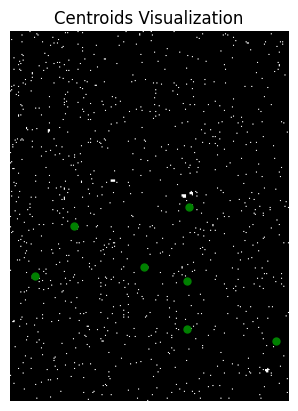

Number of Dots: 7
Positions of Centroids:
(233, 271)
(155, 260)
(155, 218)
(21, 214)
(117, 206)
(56, 170)
(156, 153)


In [115]:
num_dots, centroids = white_dot_centroids_detection(image_binary, visualize=True)
print("Number of Dots:", num_dots)
print("Positions of Centroids:")
for centroid in centroids:
    print(centroid)